# 1.. Lets Prepare data for Analysis

In [64]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [65]:
uber_15=pd.read_csv(r'C:\Users\SIMRAN AMBADE\Desktop\Analytics\python_data/uber_dataset/uber-raw-data-janjune-15.csv',encoding='utf-8')

In [66]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [67]:
uber_15.shape

(14270479, 4)

In [68]:
uber_15.duplicated().sum()

898225

In [69]:
uber_15.drop_duplicates(inplace=True)

In [70]:
uber_15.shape

(13372254, 4)

# 2..Which month have max. Uber pickups in New York City ?

In [71]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [72]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [73]:
uber_15['Pickup_date']=pd.to_datetime(uber_15['Pickup_date'], format ='%Y-%m-%d %H:%M:%S' )

In [74]:
uber_15['Pickup_date'].dtype

dtype('<M8[ns]')

In [75]:
uber_15['month']=uber_15['Pickup_date'].dt.month

In [76]:
uber_15['month'].head()

0    5
1    5
2    5
3    5
4    5
Name: month, dtype: int64

In [77]:
uber_15 = uber_15.reset_index()

In [78]:
uber_15.drop(["index"], axis=1, inplace=True)

<Axes: >

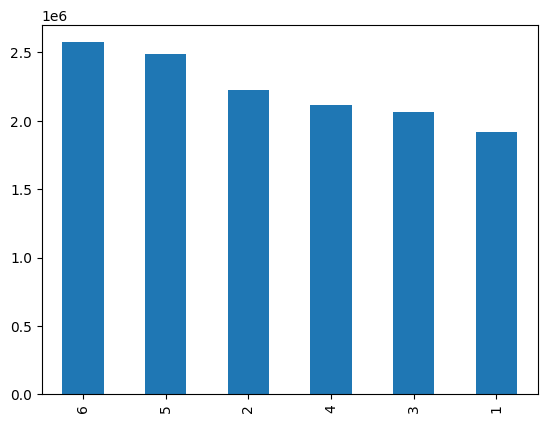

In [79]:
uber_15['month'].value_counts().plot(kind='bar')

# 3.. Lets Find out Total trips for each month & each weekdays..

In [81]:
## extracting dervied features (weekday ,day ,hour ,month ,minute) from 'Pickup_date'..

uber_15['weekday']=uber_15['Pickup_date'].dt.day_name()
uber_15['day']=uber_15['Pickup_date'].dt.day
uber_15['hour']=uber_15['Pickup_date'].dt.hour
uber_15['month']=uber_15['Pickup_date'].dt.month
uber_15['minute']=uber_15['Pickup_date'].dt.minute

In [82]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-17 09:47:00,B02617,141,5,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,5,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,5,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,5,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,5,Sunday,17,9,47


In [83]:
temp=uber_15.groupby(by=["month","weekday"]).count()[["locationID"]].reset_index()
temp.head()


,month,weekday,locationID
0,1,Friday,339285
1,1,Monday,190606
2,1,Saturday,386049
3,1,Sunday,230487
4,1,Thursday,330319


In [84]:
dict_month={1:'Jan', 2:'Feb', 3:'March', 4:'april', 5:'May', 6:'June'}

In [85]:
temp['month']=temp['month'].map(dict_month)

In [86]:
temp['month']

0       Jan
1       Jan
2       Jan
3       Jan
4       Jan
5       Jan
6       Jan
7       Feb
8       Feb
9       Feb
10      Feb
11      Feb
12      Feb
13      Feb
14    March
15    March
16    March
17    March
18    March
19    March
20    March
21    april
22    april
23    april
24    april
25    april
26    april
27    april
28      May
29      May
30      May
31      May
32      May
33      May
34      May
35     June
36     June
37     June
38     June
39     June
40     June
41     June
Name: month, dtype: object

In [87]:
type(uber_15.groupby(['month','weekday']).size())

pandas.core.series.Series

In [88]:
temp


,month,weekday,locationID
0,Jan,Friday,339285
1,Jan,Monday,190606
2,Jan,Saturday,386049
3,Jan,Sunday,230487
4,Jan,Thursday,330319
5,Jan,Tuesday,196574
6,Jan,Wednesday,245650
7,Feb,Friday,373550
8,Feb,Monday,274948
9,Feb,Saturday,368311


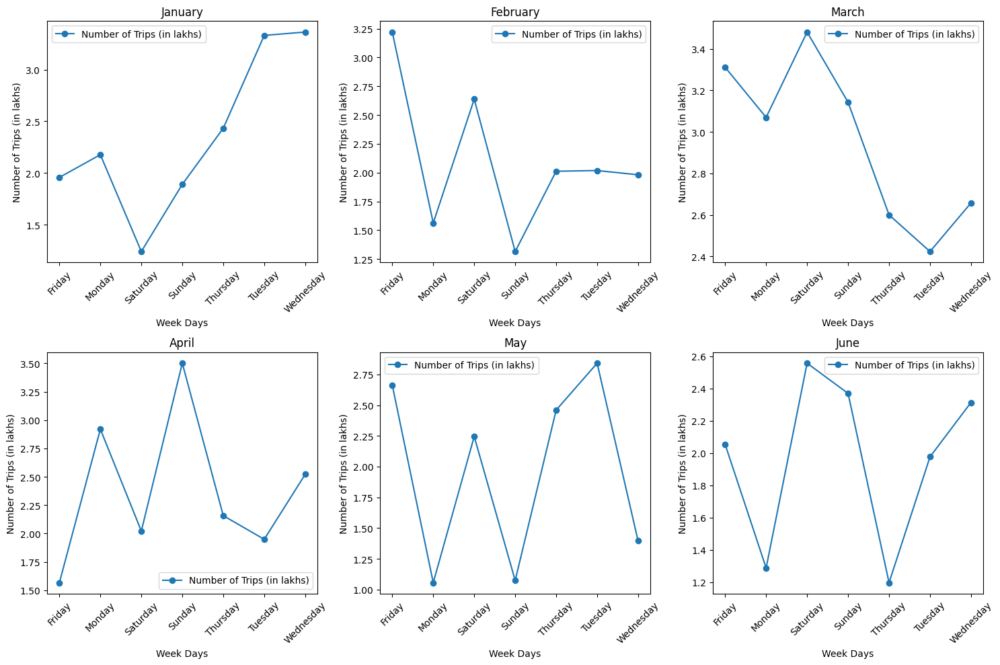

In [89]:
months = ['January', 'February', 'March', 'April', 'May', 'June']
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
data = np.random.randint(low=100000, high=400000, size=(len(months)*len(weekdays)))

# Create a DataFrame
temp = pd.DataFrame({'month': np.repeat(months, len(weekdays)),
                     'weekday': np.tile(weekdays, len(months)),
                     'trips': data})

# Create subplots for each month
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = np.ravel(axes)

for i, month in enumerate(months):
    ax = axes[i]
    df_month = temp[temp['month'] == month]
    df_month = df_month.sort_values(by='weekday')
    
    # Plot the line chart
    ax.plot(df_month['weekday'], df_month['trips'] / 100000, marker='o', linestyle='-', label='Number of Trips (in lakhs)')
    
    # Set title and labels
    ax.set_title(month)
    ax.set_xlabel('Week Days')
    ax.set_ylabel('Number of Trips (in lakhs)')
    ax.legend()  # Show legend for each subplot
    
    # Rotate x-axis labels for better readability
    ax.tick_params(axis='x', rotation=45)

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots


# 4.. Lets Find out Hourly Rush in New york city on all days

In [90]:
summary=uber_15.groupby(['weekday','hour'],as_index=False).size()

summary

,weekday,hour,size
0,Friday,0,79879
1,Friday,1,44563
2,Friday,2,27252
3,Friday,3,19076
4,Friday,4,23049
...,...,...,...
163,Wednesday,19,131317
164,Wednesday,20,123490
165,Wednesday,21,120941
166,Wednesday,22,115208


<Axes: xlabel='hour', ylabel='size'>

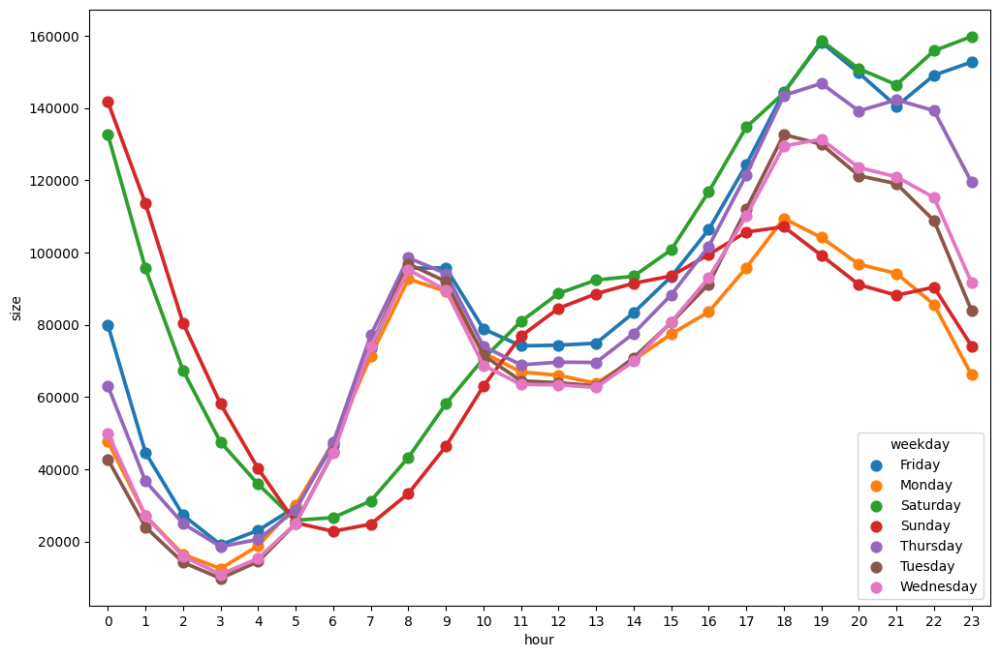

In [91]:
## pointplot between 'hour' & 'size' for all the weekdays..

plt.figure(figsize=(12,8))
sns.pointplot(x='hour',y='size',hue='weekday',data=summary)

# 5.. Which Base_number has most number of Active Vehicles ??

In [92]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-17 09:47:00,B02617,141,5,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,5,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,5,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,5,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,5,Sunday,17,9,47


In [63]:
## lets read  "Uber-Jan-Feb-FOIL.csv"..
uber_foil=pd.read_csv(r'C:\Users\SIMRAN AMBADE\Desktop\Analytics\python_data/uber_dataset/Uber-Jan-Feb-FOIL.csv')

In [93]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [94]:
uber_foil = uber_foil.groupby(by=["dispatching_base_number"]).sum()[["active_vehicles"]]
uber_foil

C:\Users\SIMRAN AMBADE\AppData\Local\Temp\ipykernel_1152\1395482905.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  uber_foil = uber_foil.groupby(by=["dispatching_base_number"]).sum()[["active_vehicles"]]


,active_vehicles
dispatching_base_number,
B02512,13125
B02598,58653
B02617,79758
B02682,71431
B02764,217290
B02765,22575


In [95]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import download_plotlyjs ,plot ,iplot ,init_notebook_mode
init_notebook_mode(connected=True)


<Axes: xlabel='dispatching_base_number'>

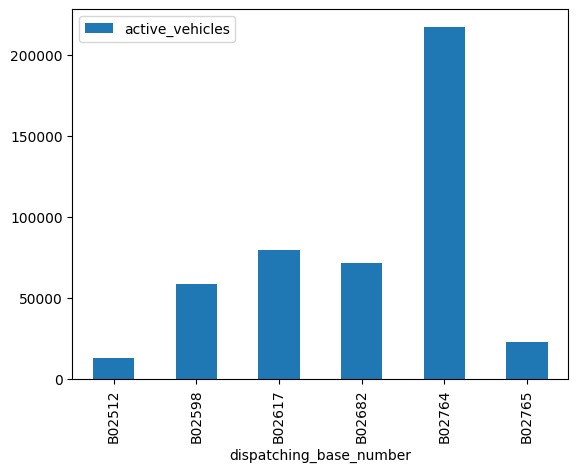

In [96]:
uber_foil.plot(kind='bar')

# 6.. Collect entire data & Make it ready for the Data Analysis..

In [97]:
import os

In [98]:
files=os.listdir(r'C:\Users\SIMRAN AMBADE\Desktop\Analytics\python_data\uber_dataset')[-7:]

files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [99]:
files.remove('uber-raw-data-janjune-15.csv')

files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [100]:
path = r'C:\Users\SIMRAN AMBADE\Desktop\Analytics\python_data\uber_dataset'

final = pd.DataFrame()

for file in files:
    current_df=pd.read_csv(path+'/'+file,encoding='utf-8')
    final=pd.concat([current_df,final])

In [101]:
final.shape

(4534327, 4)

In [102]:
final.head(2)

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512


In [103]:
final.duplicated().sum()

82581

In [104]:
final.shape

(4534327, 4)

## Dataset Information : 

### The dataset contains information about the Datetime, Latitude, Longitude and Base of each uber ride that happened in the month of July 2014 at New York City, USA

##### Date/Time : The date and time of the Uber pickup

##### Lat : The latitude of the Uber pickup

##### Lon : The longitude of the Uber pickup

##### Base : The TLC base company code affiliated with the Uber pickup

    The Base codes are for the following Uber bases:
    B02512 : Unter
    B02598 : Hinter
    B02617 : Weiter
    B02682 : Schmecken
    B02764 : Danach-NY

    ->> The globe is split into an imaginary 360 sections from both top to bottom (north to south) and 180 sections from side to side (west to east). The sections running from top to bottom on a globe are called longitude, and the sections running from side to side on a globe are called latitude.

    ->> Latitude is the measurement of distance north or south of the Equator.

    ->> Every location on earth has a global address. Because the address is in numbers, people can communicate about location no matter what language they might speak. A global address is given as two numbers called coordinates. The two numbers are a location's latitude number and its longitude number ("Lat/Long").

# 7.. at what locations of New York City we are getting rush ??

In [105]:
rush_uber=final.groupby(['Lat','Lon'],as_index=False).size()

In [106]:
rush_uber

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,2


In [107]:
import folium

In [108]:
basemap=folium.Map()

In [109]:
from folium.plugins import HeatMap

In [110]:
HeatMap(rush_uber).add_to(basemap)

In [111]:
basemap

We can see a number of hot spots here. Midtown Manhattan is clearly a huge bright spot.
& these are made from Midtown to Lower Manhattan.
Followed by Upper Manhattan and the Heights of Brooklyn.

# 8.. Examine rush on Hour and Weekday ( Perform Pair wise Analysis )

In [112]:
final.tail(35)

,Date/Time,Lat,Lon,Base
564481,4/30/2014 21:58:00,40.7537,-73.9820,B02764
564482,4/30/2014 22:04:00,40.7361,-73.9851,B02764
564483,4/30/2014 22:07:00,40.7459,-73.9843,B02764
564484,4/30/2014 22:14:00,40.7209,-74.0042,B02764
564485,4/30/2014 22:24:00,40.7583,-73.9901,B02764
564486,4/30/2014 22:25:00,40.7342,-74.0101,B02764
564487,4/30/2014 22:25:00,40.7412,-73.9792,B02764
564488,4/30/2014 22:25:00,40.7633,-73.9867,B02764
564489,4/30/2014 22:26:00,40.7549,-73.9845,B02764
564490,4/30/2014 22:27:00,40.7210,-73.9850,B02764


In [113]:
final['Date/Time']=pd.to_datetime(final['Date/Time'],format ='%m/%d/%Y %H:%M:%S')

In [114]:
final['weekday']=final['Date/Time'].dt.day
final['hour']=final['Date/Time'].dt.hour

In [115]:
final.head()

,Date/Time,Lat,Lon,Base,weekday,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,1,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,1,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,1,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,1,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,1,0


In [116]:
pivot=final.groupby(['weekday','hour']).size().unstack()

In [117]:
type(final.groupby(['weekday','hour']).size())

pandas.core.series.Series

In [118]:
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
1,3247,1982,1284,1331,1458,2171,3717,5470,5376,4688,...,7050,8033,8760,9661,8727,8146,7448,7960,6397,4128
2,2480,1600,1109,1442,1897,2861,5002,6646,6420,4795,...,7021,8581,10267,11301,11326,9654,8903,8506,7111,5247
3,3415,2176,1434,1489,1578,2437,4318,5775,5482,4732,...,7327,8991,10472,10665,11433,9765,9158,8646,7246,4767
4,2944,1718,1217,1449,1737,2623,4687,6146,5799,4814,...,7307,8678,9661,10550,10458,9296,8508,8804,7852,5224
5,2786,1567,1047,1278,1648,2958,4919,6379,6580,5616,...,7072,8453,9770,10887,10324,9582,9512,9785,9020,6640
6,4623,2932,1902,1599,1584,2201,3705,4846,5009,4482,...,7353,8751,9615,10130,9437,8575,8286,8734,8000,6061
7,3715,2326,1533,1622,1793,2464,4172,5649,5459,4706,...,7418,8624,10585,11185,10767,9674,8862,8692,7337,4902
8,2882,1672,1147,1509,1921,3282,5528,7474,7472,5770,...,7356,8910,10007,10871,9874,8964,8768,8528,6917,4331
9,2708,1757,1246,1501,1911,3227,5910,7720,7641,5983,...,7997,9360,10419,12116,11677,9979,9061,8806,7637,5290


In [119]:
pivot.style.background_gradient()

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,,,,
1,3247,1982,1284,1331,1458,2171,3717,5470,5376,4688,4680,4811,5018,5887,7050,8033,8760,9661,8727,8146,7448,7960,6397,4128
2,2480,1600,1109,1442,1897,2861,5002,6646,6420,4795,4886,5067,5278,5801,7021,8581,10267,11301,11326,9654,8903,8506,7111,5247
3,3415,2176,1434,1489,1578,2437,4318,5775,5482,4732,4864,5162,5462,6189,7327,8991,10472,10665,11433,9765,9158,8646,7246,4767
4,2944,1718,1217,1449,1737,2623,4687,6146,5799,4814,4822,5067,5289,6273,7307,8678,9661,10550,10458,9296,8508,8804,7852,5224
5,2786,1567,1047,1278,1648,2958,4919,6379,6580,5616,5225,5097,5129,5780,7072,8453,9770,10887,10324,9582,9512,9785,9020,6640
6,4623,2932,1902,1599,1584,2201,3705,4846,5009,4482,4891,5264,5528,6378,7353,8751,9615,10130,9437,8575,8286,8734,8000,6061
7,3715,2326,1533,1622,1793,2464,4172,5649,5459,4706,4982,5266,5455,6315,7418,8624,10585,11185,10767,9674,8862,8692,7337,4902
8,2882,1672,1147,1509,1921,3282,5528,7474,7472,5770,5368,5433,5576,6424,7356,8910,10007,10871,9874,8964,8768,8528,6917,4331
9,2708,1757,1246,1501,1911,3227,5910,7720,7641,5983,5500,5542,5607,6540,7997,9360,10419,12116,11677,9979,9061,8806,7637,5290


# 9.. How to Automate Your Analysis..?

In [120]:
def gen_pivot_table(df,col1,col2):
    pivot=df.groupby([col1,col2]).size().unstack()
    return pivot.style.background_gradient()

In [121]:
final.columns

Index(['Date/Time', 'Lat', 'Lon', 'Base', 'weekday', 'hour'], dtype='object')

In [122]:
gen_pivot_table(final,'weekday','hour')

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,,,,
1,3247,1982,1284,1331,1458,2171,3717,5470,5376,4688,4680,4811,5018,5887,7050,8033,8760,9661,8727,8146,7448,7960,6397,4128
2,2480,1600,1109,1442,1897,2861,5002,6646,6420,4795,4886,5067,5278,5801,7021,8581,10267,11301,11326,9654,8903,8506,7111,5247
3,3415,2176,1434,1489,1578,2437,4318,5775,5482,4732,4864,5162,5462,6189,7327,8991,10472,10665,11433,9765,9158,8646,7246,4767
4,2944,1718,1217,1449,1737,2623,4687,6146,5799,4814,4822,5067,5289,6273,7307,8678,9661,10550,10458,9296,8508,8804,7852,5224
5,2786,1567,1047,1278,1648,2958,4919,6379,6580,5616,5225,5097,5129,5780,7072,8453,9770,10887,10324,9582,9512,9785,9020,6640
6,4623,2932,1902,1599,1584,2201,3705,4846,5009,4482,4891,5264,5528,6378,7353,8751,9615,10130,9437,8575,8286,8734,8000,6061
7,3715,2326,1533,1622,1793,2464,4172,5649,5459,4706,4982,5266,5455,6315,7418,8624,10585,11185,10767,9674,8862,8692,7337,4902
8,2882,1672,1147,1509,1921,3282,5528,7474,7472,5770,5368,5433,5576,6424,7356,8910,10007,10871,9874,8964,8768,8528,6917,4331
9,2708,1757,1246,1501,1911,3227,5910,7720,7641,5983,5500,5542,5607,6540,7997,9360,10419,12116,11677,9979,9061,8806,7637,5290


Conclusion:-

Upon analyzing the graph, it becomes evident that in June, there is a significant increase in pickups, totaling 2.5 million, compared to the preceding months from January to May. Notably, January stands out with a lower pickup count of 1.92 million.

In January, the highest number of trips occurs on Saturday, totaling 3.86 lakh, while Monday records the lowest count.

February witnesses the peak number of trips on Friday, with 3.74 lakh, and the lowest on Monday.

March experiences its maximum trips on Tuesday, amounting to 3.21 lakh, while Wednesday has the fewest.

April highlights Thursday with the highest number of trips, reaching 3.73 lakh, and Monday with the fewest.

May demonstrates the highest number of trips on Saturday, totaling 4.64 lakh, and the lowest on Monday.

June's peak number of trips falls on Tuesday, totaling 4.06 lakh, while Wednesday has the lowest count.

An intriguing observation is that Saturday and Sunday exhibit a similar demand pattern during the late night, morning, and afternoon. However, during the evening, they display opposite trends.

On Saturday, pickups continue to increase in the evening, while on Sunday, they begin to decline.

Notably, Friday and Saturday are the weekdays with the highest demand during the late evening, which aligns with expectations.

Interestingly, Thursday nights also exhibit a similar pattern to Friday and Saturday nights, suggesting that New Yorkers may commence their 'weekend' activities on Thursday nights.

The graph indicates that Base Number B02764 boasts the highest count of active vehicles.

Notably, there are several hot spots visible, particularly in Midtown Manhattan, where activity is notably high.

Additionally, these hot spots extend from Midtown to Lower Manhattan, demonstrating considerable activity.

Upper Manhattan and the Heights of Brooklyn also register significant levels of activity.

Utilizing this pivot table with a background gradient enables us to better discern the patterns of rush hours and weekdays effectively